In [256]:
import joblib
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns

import copy
import time

import sklearn
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error


from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.ar_model import AutoReg

import pytz

In [3]:
data = joblib.load('air_quality_dar_er_salaam')  #loading the dataset

In [231]:
df = pd.DataFrame(data)
df.head()

,P2,timestamp
0,9.27,2018-01-01 00:00:04.053
1,8.17,2018-01-01 00:02:33.847
2,9.70,2018-01-01 00:05:03.874
3,10.10,2018-01-01 00:07:33.675
4,9.65,2018-01-01 00:10:03.888


In [232]:
#reseting the timestamp as index and converting timezone to Dar Er Salaam
df.set_index('timestamp', inplace = True)
df.index = df.index.tz_localize("UTC").tz_convert('Africa/Dar_es_Salaam')

In [107]:
#Checking for null values
df.isna().sum()

P2    0
dtype: int64

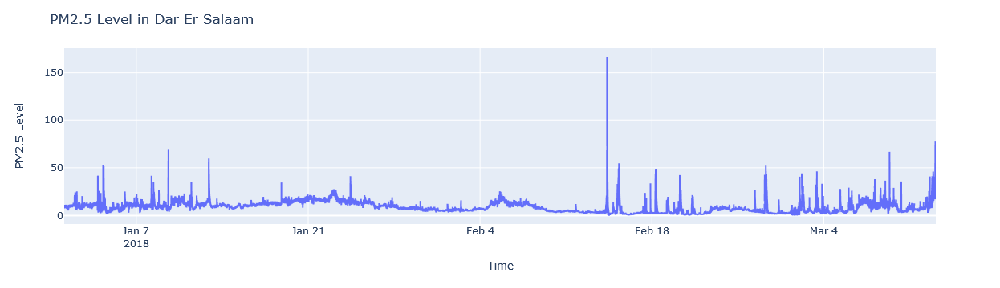

In [83]:
#plotting the time series graph
fig = px.line(df, y =  'P2', x= df.index )

fig.update_layout(title = 'PM2.5 Level in Dar Er Salaam', 
                 xaxis_title = 'Time',
                 yaxis_title = 'PM2.5 Level')
fig.show()

Looking at the graph, we have some spikes here and there and possible outliers but we don't see any discernable pattern

In [87]:
#summary stats
df.describe()

,P2
count,51922.000000
mean,8.393314
std,5.457231
min,0.400000
25%,4.270000
50%,7.600000
75%,11.330000
max,166.470000


From the above we see that 75% of the data is between 0.4 and 11.3, and 25% of the data is above 11.33. Also the mean and median are fairly close which suggest that the distribution does have not so many outlier

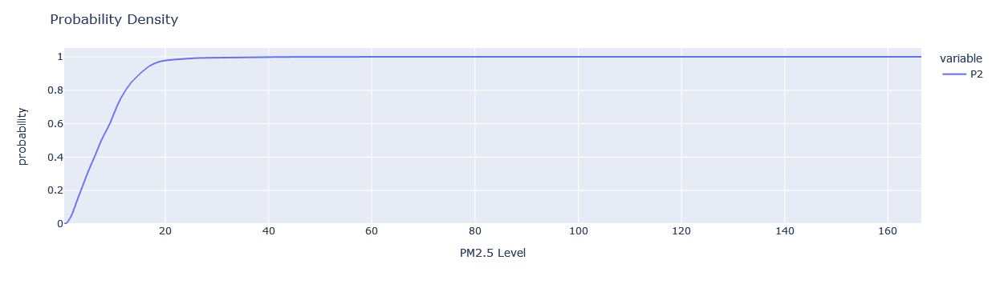

In [78]:
#ploting a probaility density curve
fig = px.ecdf(df )

fig.update_layout(title = 'Probability Density', 
                  xaxis_title = 'PM2.5 Level')

fig.show()

We see that 99% of the data is less than a P2 = 25

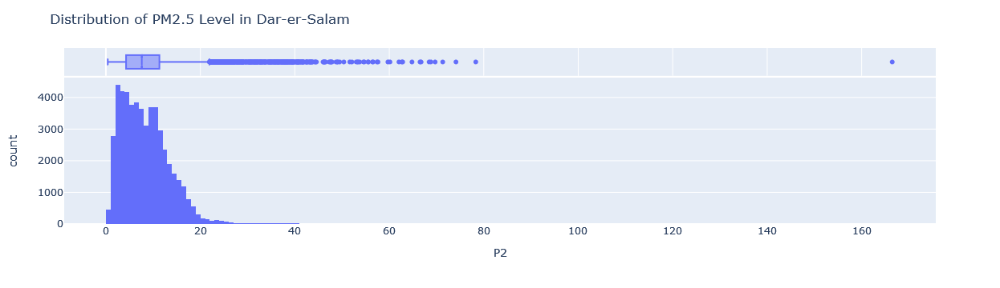

In [80]:
#plotting a histogram and bloxplot distribution for better visual

fig = px.histogram(df, x =  'P2', nbins = 250, marginal = 'box' )

fig.update_layout(title = 'Distribution of PM2.5 Level in Dar-er-Salam' )

In [108]:
#Examining the above we filter out values greater than 80 for the rest of our analyis
df = df[df< 80]

In [109]:
#Our data is not sampled at regular intervals so we need to resample to create a good predictive model
#Resampling data to a 1-hour window and using forward fill method to replace null values

y= df['P2'].resample('1H', label = 'right', closed = 'right').mean().fillna(method = 'ffill')
y.head()

timestamp
2018-01-01 04:00:00+03:00    9.456327
2018-01-01 05:00:00+03:00    9.400833
2018-01-01 06:00:00+03:00    9.331458
2018-01-01 07:00:00+03:00    9.528776
2018-01-01 08:00:00+03:00    8.861250
Freq: H, Name: P2, dtype: float64

In [111]:
y.isna().sum()   #no null values

0

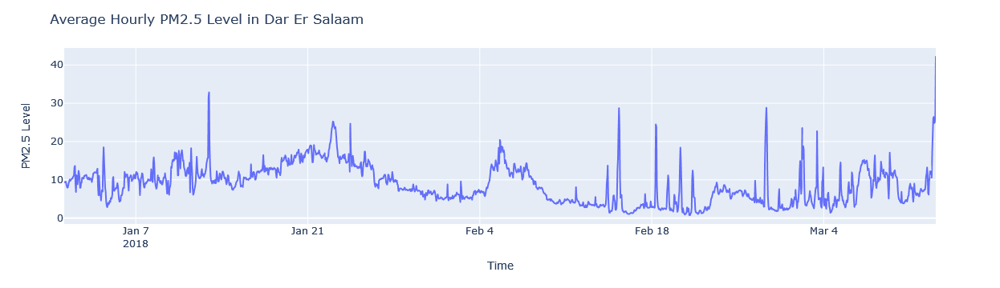

In [113]:
#plotting the resampled data
fig = px.line(y, y =  'P2', x= y.index )

fig.update_layout(title = 'Average Hourly PM2.5 Level in Dar Er Salaam', 
                 xaxis_title = 'Time',
                 yaxis_title = 'PM2.5 Level')
fig.show()

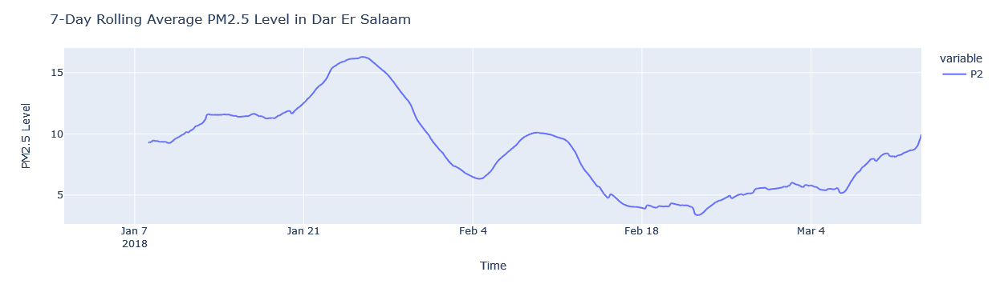

In [ ]:
#plotting a 7-day rolling average
fig = px.line(y.rolling(168).mean() )

fig.update_layout(title = '7-Day Rolling Average PM2.5 Level in Dar Er Salaam', 
                 xaxis_title = 'Time',
                 yaxis_title = 'PM2.5 Level')
fig.show()

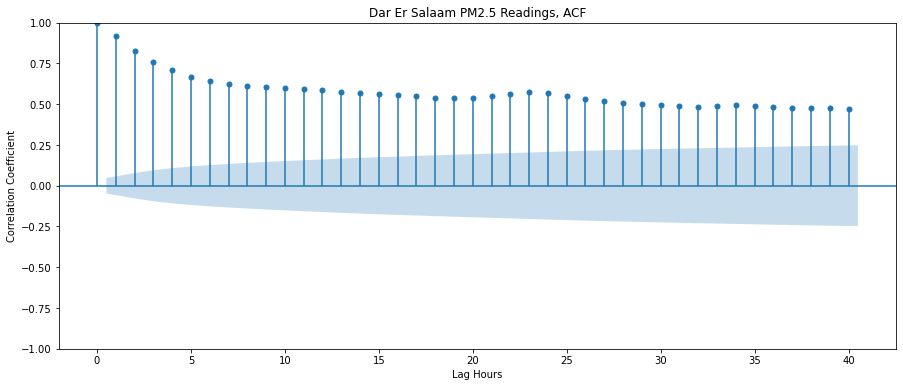

In [125]:
#plotting an ACF plot 
fig, ax = plt.subplots(figsize=(15, 6))
plot_acf(y, lags = 40, ax = ax )
plt.xlabel("Lag Hours")
plt.ylabel("Correlation Coefficient")
plt.title('Dar Er Salaam PM2.5 Readings, ACF')
plt.show()

When the lag is 0 we get a perfect correlation as expected and the correlation drops rapidly as we increase the lag hours. Also we can be confident in the results as no value is within the light blue shape since data within the shape are likely due to chance

/home/tb23unix/anaconda3/lib/python3.8/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



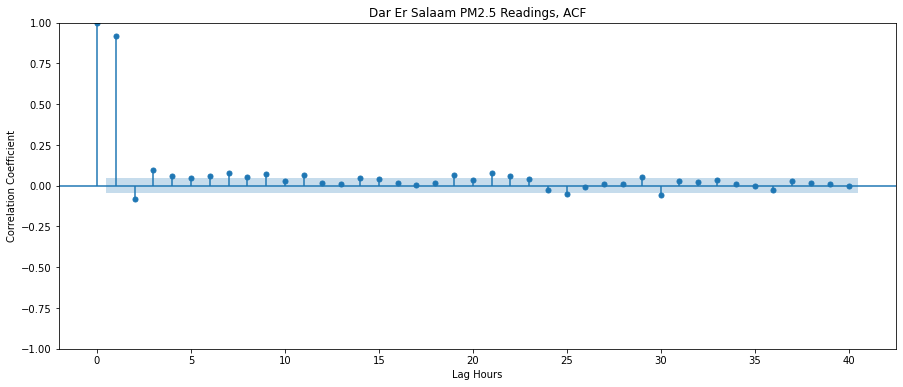

In [126]:
#Plotting the PACF plot
fig, ax = plt.subplots(figsize=(15, 6))
plot_pacf(y, lags = 40, ax = ax )
plt.xlabel("Lag Hours")
plt.ylabel("Correlation Coefficient")
plt.title('Dar Er Salaam PM2.5 Readings, PACF')
plt.show()

Observing the PACF plot, there is a strong correlation when the lag is 1 hour which is the same value in the ACF plot. Above 1 hours lag, the correlation values drop significantly and  the observed pattern is random. Also a lot of the values are within the blue shape meaning the very small observed correlations are probably due to chance.
We deduce that other than a time lag(k) of 1hr, there is no direct correlation between values at time t and at time t-k

### Model Prep

In [127]:
#spliting into  train and test set
cut_off = int(len(y)*0.9)
y_train=  y.iloc[: cut_off]
y_test =  y.iloc[cut_off:]
print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)

y_train shape: (1533,)
y_test shape: (171,)


In [131]:
#base_line result
y_train_mean =  y_train.mean()
y_pred_baseline = [y_train_mean] * len(y_train)
mae_baseline = mean_absolute_error(y_train, y_pred_baseline)

print("Mean P2 Reading:", y_train_mean)
print("Baseline MAE:", mae_baseline)

Mean P2 Reading: 8.617575462980465
Baseline MAE: 4.076594135810508


In [351]:
#Building an AR model and tuning the lag  

p_params = range(1, 31)
maes = []

for p in p_params:
    # Train model
    model = AutoReg(y_train, lags = p, old_names = False).fit()
    # Generate in-sample (training) predictions
    y_pred = model.predict().dropna()
    # Calculate training MAE
    mae = mean_absolute_error(y_train.loc[y_pred.index], y_pred)
    # Append MAE to list 
    maes.append(mae)


mae_series = pd.Series(maes, name="mae", index=p_params)
mae_series.head()

1    0.947902
2    0.933894
3    0.920857
4    0.920169
5    0.919532
Name: mae, dtype: float64

In [305]:
# building final model with the p value that gave lowest mae
best_p = mae_series.idxmin()
best_model = AutoReg(y_train, lags = best_p, old_names = False).fit()

In [306]:
#making prediction on train_set and dropping null values since the first 28 values in the data do not have 28 previous terms
y_pred_train = best_model.predict().dropna()
y_pred_train

timestamp
2018-01-02 08:00:00+03:00    10.619813
2018-01-02 09:00:00+03:00    12.173621
2018-01-02 10:00:00+03:00    11.085961
2018-01-02 11:00:00+03:00    10.120285
2018-01-02 12:00:00+03:00     7.950437
                               ...    
2018-03-05 20:00:00+03:00     3.751859
2018-03-05 21:00:00+03:00     4.564856
2018-03-05 22:00:00+03:00     4.795119
2018-03-05 23:00:00+03:00     4.477968
2018-03-06 00:00:00+03:00     4.957667
Freq: H, Length: 1505, dtype: float64

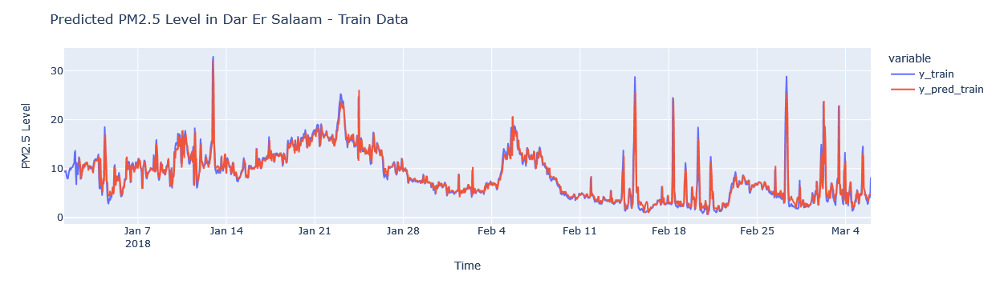

In [309]:
#line plot of actual and predicted train data
df_pred_train = pd.DataFrame({'y_train': y_train, 'y_pred_train' : y_pred_train}, index = y_train.index)
fig = px.line(df_pred_train)
fig.update_layout(title = 'Predicted PM2.5 Level in Dar Er Salaam - Train Data', 
                 xaxis_title = 'Time',
                 yaxis_title = 'PM2.5 Level')
fig.show()

Looks like our model is a very good one but we will have to validate this with our test data

Let's look at the residuals

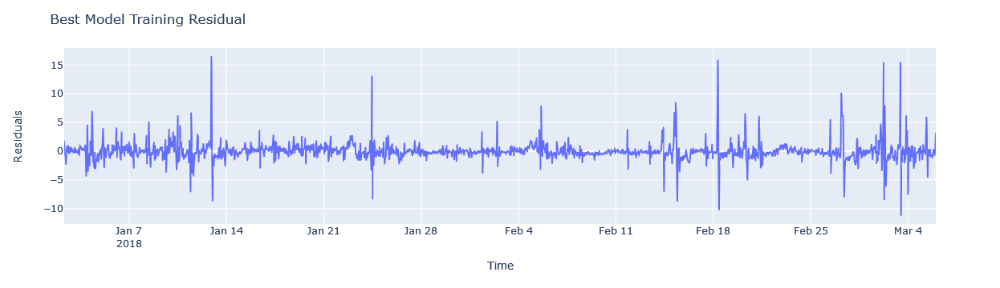

In [308]:
y_train_resid = best_model.resid
#plotting the distrbution of  the training residual
fig = px.line(x = y_train_resid.index, y = y_train_resid)
fig.update_layout(title = 'Best Model Training Residual',
                 yaxis_title = 'Residuals',
                 xaxis_title = 'Time')
fig.show()

From the above plot we do not see any particular trend of the residuals(pattern looks random) and the distribution looks fairly centered around 0. This suggest that our model is not missing any key information

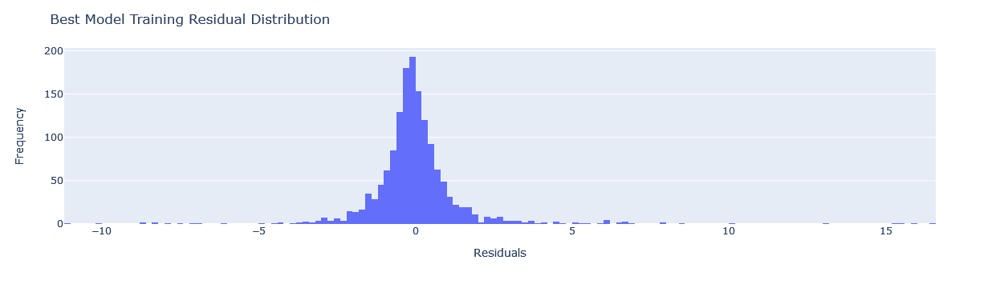

In [181]:
#plotting the distrbution of  the training residual
fig = px.histogram(x = best_model.resid)
fig.update_layout(title = 'Best Model Training Residual Distribution',
                 xaxis_title = 'Residuals',
                 yaxis_title = 'Frequency')
fig.show()

The residual values are approximately normally distributed as expected which suggests a good model

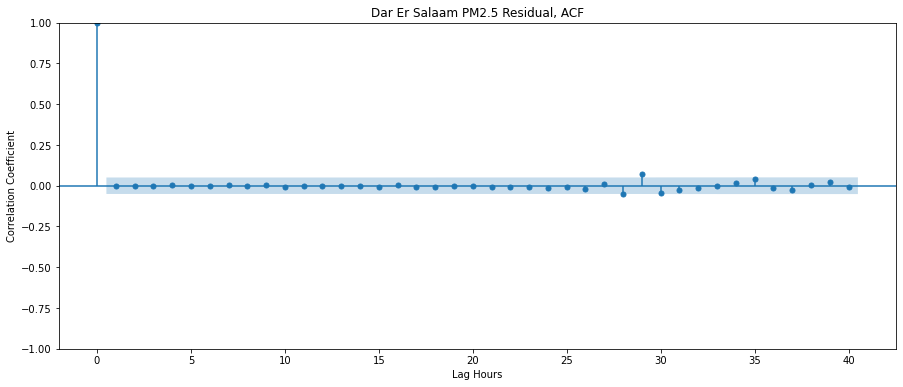

In [285]:
#pl0tting an ACF plot of our residual
fig, ax = plt.subplots(figsize=(15, 6))
plot_acf(y_train_resid, lags = 40, ax = ax )
plt.xlabel("Lag Hours")
plt.ylabel("Correlation Coefficient")
plt.title('Dar Er Salaam PM2.5 Residual, ACF')
plt.show()

Graph shows that is there virtually no correlation for residuals at different lag hours.In other words, there is no way to predict a residual from a given time stamp by looking at the residual from any previous time step(s). If the graph had shown significant correlations, it means our model did not capture  some patterns in the data. Lag of 0 hours gives perfect correlation as expected!

## Evaluation

In [323]:
#Test set MAE
y_pred_test = best_model.predict(y_test.index.min(), y_test.index.max())
test_mae = mean_absolute_error(y_test, y_pred_test)
print("Test MAE:", test_mae)

Test MAE: 3.9564489982166764


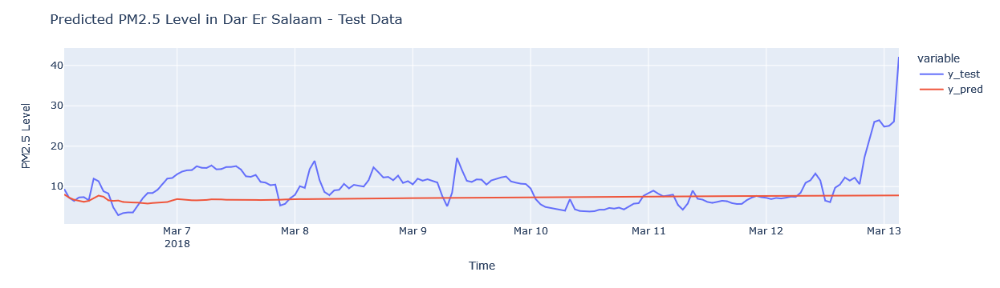

In [324]:
#line plot of actual and predicted test result
df_pred_test = pd.DataFrame({'y_test': y_test, 'y_pred' : y_pred_test}, index = y_test.index)
fig = px.line(df_pred_test)
fig.update_layout(title = 'Predicted PM2.5 Level in Dar Er Salaam - Test Data', 
                 xaxis_title = 'Time',
                 yaxis_title = 'PM2.5 Level')
fig.show()

Our model performed very badly on the test as shown  by the MAE score and also looking the plot above. Looking at plot above we see that the predicted values seems to follow the actuals intially, but it quickly loses control and does nothing. Remember our model uses the previous 28 values to make a prediction, so as it steps forward in time, it uses less of the actual values and more of the predicted values(which have errors) it made to make a new prediction. So the errors grow cummulatively and the predictions get progressivlely worse.
We are going to implement forward validation to mitigate this

In [347]:
#Implementing a walk forward validation ot retrain the model with every new time step that passes
y_pred_wfv = pd.Series().astype('float') #the predicted values with walk forward validation will be stored in this series
history = y_train.copy()  #making a copy of the trains set which will be updated with the actual value at the time step after prediction

#after each step, trains a new model after with data from all past time steps and then new model is used to predict value at current step 
for i in range(len(y_test)):
    r = AutoReg(history, 26, old_names = False).fit()
    next_pred = r.forecast()
    y_pred_wfv = y_pred_wfv.append(next_pred)
    history = history.append(y_test[next_pred.index])

/tmp/ipykernel_177/3270887849.py:2: DeprecationWarning:

The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.



In [348]:
#Test MAE with Walk Forward Validation
test_mae = mean_absolute_error(y_test, y_pred_wfv)
print("Test MAE:", test_mae)

Test MAE: 1.3366839802513422


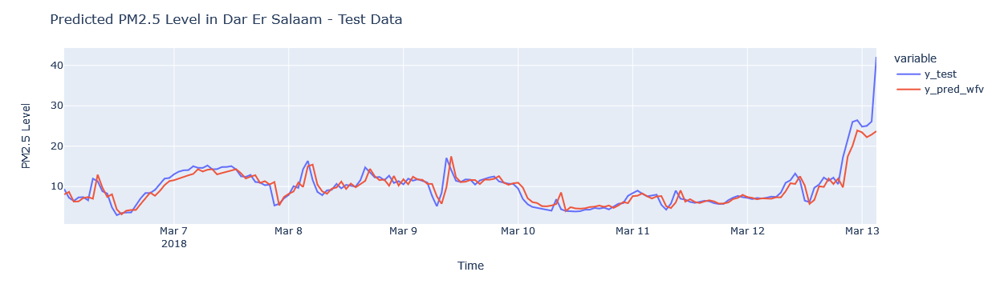

In [350]:
#line plot of actual and predicted test result with Walk Forward Validation
df_pred_test = pd.DataFrame({'y_test': y_test, 'y_pred_wfv' : y_pred_wfv}, index = y_test.index)
fig = px.line(df_pred_test)
fig.update_layout(title = 'Predicted PM2.5 Level in Dar Er Salaam - Test Data', 
                 xaxis_title = 'Time',
                 yaxis_title = 'PM2.5 Level')
fig.show()

That is more like it! With Walk Forward Validation, there is significant improvement in MAE and the above graph shows it as well. Our final MAE score is 1.3 compared with the baseline MAE of 3.9 